# Berlin Airbnb
We are analyzing the 2022 data on Airbnbs in Berlin, taken from http://insideairbnb.com/.
Our ultimate goal is to create a regression model for predicting the prices.

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
import plotly
import plotly.express as px
import json
from wordcloud import WordCloud
import re
from collections import Counter

To start we load the data regarding the listings themselves, reviews of each one as well as regarding the calender into dataframes. We also get a geojson containing information about
the different neighbourhood categories, which we read using geopandas.

In [2]:

calendarPath = 'data/calendar.csv'
listingsPath = 'data/listings.csv'
reviewsPath = 'data/reviews.csv'
neighbourhoodsPath = 'data/neighbourhoods.csv'

calendarDf = pd.read_csv(calendarPath)
listingsDf = pd.read_csv(listingsPath)
reviewsDf = pd.read_csv(reviewsPath)
neighbourhoodsDf = pd.read_csv(neighbourhoodsPath)
neighbourhoodsGeoDf = gpd.read_file('data/neighbourhoods.geojson')

# rename id in listings to listing_id for later
listingsDf['listing_id'] = listingsDf['id']

# Exploratory Data Analysis
Before modelling we will do some EDA especially to see what features differentiate the pricing
effectively.
## Listings and Calender
We start by getting info on the available features and their missing values for the listings and calendar data.

In [3]:
calendarDf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5736711 entries, 0 to 5736710
Data columns (total 7 columns):
 #   Column          Dtype  
---  ------          -----  
 0   listing_id      int64  
 1   date            object 
 2   available       object 
 3   price           object 
 4   adjusted_price  object 
 5   minimum_nights  float64
 6   maximum_nights  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 306.4+ MB


In [4]:
calendarDf.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,3176,2022-12-22,f,$83.00,$83.00,63.0,184.0
1,3176,2022-12-23,f,$83.00,$83.00,63.0,184.0
2,3176,2022-12-24,f,$83.00,$83.00,63.0,184.0
3,3176,2022-12-25,f,$83.00,$83.00,63.0,184.0
4,3176,2022-12-26,f,$83.00,$83.00,63.0,184.0


In [5]:
listingsDf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15717 entries, 0 to 15716
Data columns (total 76 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            15717 non-null  int64  
 1   listing_url                                   15717 non-null  object 
 2   scrape_id                                     15717 non-null  int64  
 3   last_scraped                                  15717 non-null  object 
 4   source                                        15717 non-null  object 
 5   name                                          15699 non-null  object 
 6   description                                   15435 non-null  object 
 7   neighborhood_overview                         8187 non-null   object 
 8   picture_url                                   15717 non-null  object 
 9   host_id                                       15717 non-null 

We do some preprocessing and cleaning on the data. We especially need to convert a few features from strings to floats.

In [6]:
# convert prices in listings and calendar from str to float
listingsDf['price'] = listingsDf['price'].apply(lambda x:float(x[1:].replace(',','')))
calendarDf['price'] = calendarDf['price'].fillna('').apply(lambda x: float(x[1:].replace(',','')) if x !='' else np.nan).astype('float')
calendarDf['adjusted_price']=calendarDf['adjusted_price'].fillna('').apply(lambda x: float(x[1:].replace(',','')) if x !='' else np.nan).astype('float')

# convert availability from string to bool
calendarDf['available']=calendarDf['available'].apply(lambda x: True if x=='t' else False)

# convert date
calendarDf['date'] = pd.to_datetime(calendarDf['date'])

# the categorical host_response_time feature is ordinal so we map it to [0,1,2,3]
listingsDf.replace({'host_response_time':{'within an hour' : 0, 'within a few hours' : 1,'within a day' : 2, 'a few days or more' : 3}},inplace=True)

# host_response_rate is a string with % at the end, we map to a float
listingsDf['host_response_rate'] = listingsDf[listingsDf['host_response_rate'].notna()]['host_response_rate'].apply(lambda x: int(x[:-1]) )
# impute missing values with median
listingsDf['host_response_rate'] = listingsDf['host_response_rate'].fillna(listingsDf['host_response_rate'].median())

# same for acceptance
listingsDf['host_acceptance_rate'] = listingsDf[listingsDf['host_acceptance_rate'].notna()]['host_acceptance_rate'].apply(lambda x: int(x[:-1]) )
listingsDf['host_acceptance_rate']=listingsDf['host_acceptance_rate'].fillna(listingsDf['host_acceptance_rate'].median())

We drop unnecessary features from listings and define a feature for price per number of bedrooms.

In [7]:
listingsDf=listingsDf.drop('listing_url',axis=1)
listingsDf=listingsDf.drop('scrape_id',axis=1)
listingsDf=listingsDf.drop('last_scraped',axis=1)
listingsDf=listingsDf.drop('source',axis=1)
listingsDf=listingsDf.drop('picture_url',axis=1)
listingsDf=listingsDf.drop('host_url',axis=1)
listingsDf=listingsDf.drop('host_thumbnail_url',axis=1)
listingsDf=listingsDf.drop('host_picture_url',axis=1)
listingsDf=listingsDf.drop('calendar_updated',axis=1)
listingsDf=listingsDf.drop('calendar_last_scraped',axis=1)

listingsDf['price_per_bedroom']=listingsDf['price']/listingsDf['bedrooms']



In [8]:
listingsDf.head()

,id,name,description,neighborhood_overview,host_id,host_name,host_since,host_location,host_about,host_response_time,...,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,listing_id,price_per_bedroom
0,3176,Fabulous Flat in great Location,This beautiful first floor apartment is situa...,The neighbourhood is famous for its variety of...,3718,Britta,2008-10-19,"Coledale, Australia",We love to travel ourselves a lot and prefer t...,1.0,...,4.63,First name and Last name: Nicolas Krotz Conta...,f,1,1,0,0,0.89,3176,83.0
1,9991,Geourgeous flat - outstanding views,4 bedroom with very large windows and outstand...,Prenzlauer Berg is an amazing neighbourhood wh...,33852,Philipp,2009-08-25,"Berlin, Germany",Born in Munich - lives in and loves Berlin. Wo...,2.0,...,4.86,03/Z/RA/003410-18,f,1,1,0,0,0.09,9991,45.0
2,57049,130 sqm with a view on Mauer Park,An apartment of 130 sqm right in the heart of ...,Prenzlauer Berg is no doubt one of the most my...,54283,Marine,2009-11-14,"Berlin, Germany",I'm french but I have been living in Berlin si...,1.0,...,4.75,03/Z/RA/003544-18,f,3,3,0,0,0.78,57049,140.0
3,14325,Studio Apartment in Prenzlauer Berg,The apartment is located on the upper second f...,NaN,55531,Chris + Oliver,2009-11-18,"Berlin, Germany","From Berlin, Germany. We love to travel!",2.0,...,4.42,NaN,f,4,4,0,0,0.17,14325,NaN
4,58780,light quiet beautiful 4 room flat,We offer our 4 room apartment in Prenzlauer Be...,NaN,281614,Katja,2010-11-08,"Berlin, Germany",Designer who likes discovering the world,2.0,...,4.77,03/Z/RA/007133-22,f,4,1,3,0,0.39,58780,45.0


In [9]:
listingsDf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15717 entries, 0 to 15716
Data columns (total 67 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            15717 non-null  int64  
 1   name                                          15699 non-null  object 
 2   description                                   15435 non-null  object 
 3   neighborhood_overview                         8187 non-null   object 
 4   host_id                                       15717 non-null  int64  
 5   host_name                                     15697 non-null  object 
 6   host_since                                    15697 non-null  object 
 7   host_location                                 13605 non-null  object 
 8   host_about                                    7814 non-null   object 
 9   host_response_time                            7981 non-null  

To get a first idea of the location dependence we use plotly to visualize
the prices per bedroom on a map. It is already apparent that there seems to be
a higher density of more expensive airbnbs around the city center.

In [10]:
# Create a scatter plot on a map
fig = px.scatter_mapbox(
    data_frame=listingsDf, 
    lat='latitude', 
    lon='longitude',  
    color='price_per_bedroom',
    zoom=10, 
    range_color=(0,170)
)

fig.update_layout(mapbox_style='open-street-map')
fig.show()

We can use geopandas to plot the neighbourhoods that are distinguished in the data

<Axes: >

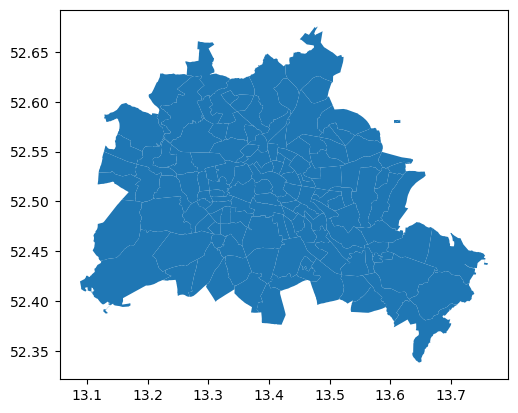

In [11]:
neighbourhoodsGeoDf.plot()

We group the data by neighbourhood (neighbourhood_group_cleansed refers to a less fine grouping) and look at the median price. This seems to confirm the previous insight, as 'Mitte'
has the highest median price.

In [12]:
listingsDf.groupby('neighbourhood_cleansed')['price'].mean().sort_values(ascending=False)

neighbourhood_cleansed
Moabit Ost           459.939394
Altglienicke         429.500000
Spandau Mitte        288.750000
Marzahn-Süd          288.363636
Schillerpromenade    237.382571
                        ...    
MV 1                  40.333333
Gropiusstadt          39.400000
Marzahn-Mitte         37.142857
Hellersdorf-Ost       23.333333
Hellersdorf-Süd       22.500000
Name: price, Length: 138, dtype: float64

In [13]:
listingsDf.groupby('neighbourhood_group_cleansed')['price'].mean()

neighbourhood_group_cleansed
Charlottenburg-Wilm.         97.112665
Friedrichshain-Kreuzberg     87.189258
Lichtenberg                  83.842333
Marzahn - Hellersdorf       111.245455
Mitte                       139.075703
Neukölln                     99.773457
Pankow                       93.961323
Reinickendorf                63.472468
Spandau                     124.938462
Steglitz - Zehlendorf        88.914365
Tempelhof - Schöneberg      102.213884
Treptow - Köpenick           89.766114
Name: price, dtype: float64

We can combine the listings with the geopandas dataframe to get a map with colorcoding
indicating the median price_per_bedroom. This again agrees with our previous observations that
the city center tends to be more expensive.

In [14]:
priceByNeighbourhoodGroup = listingsDf.groupby('neighbourhood_group_cleansed')['price_per_bedroom'].median().reset_index()
neighbourhoodsGeoDf = neighbourhoodsGeoDf.merge(priceByNeighbourhoodGroup, left_on='neighbourhood_group', right_on='neighbourhood_group_cleansed') 
priceByNeighbourhoodGroup


,neighbourhood_group_cleansed,price_per_bedroom
0,Charlottenburg-Wilm.,65.833333
1,Friedrichshain-Kreuzberg,59.000000
2,Lichtenberg,48.000000
3,Marzahn - Hellersdorf,50.000000
4,Mitte,63.000000
5,Neukölln,45.000000
6,Pankow,63.000000
7,Reinickendorf,49.000000
8,Spandau,55.000000
9,Steglitz - Zehlendorf,51.333333


<Axes: >

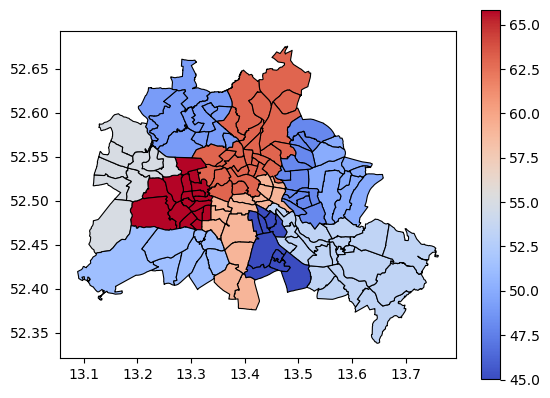

In [15]:
# price per bedroom on different neighbourhood groups
neighbourhoodsGeoDf.plot(column='price_per_bedroom', cmap='coolwarm', linewidth=0.8, edgecolor='black', legend=True)


### Number of Bathrooms and Bedrooms
From the bathrooms_text feature we extract the number of bathrooms by simply casting the 
number in the front to a float. If that is not possible we set it to the lowest number of 0.5.

In [16]:
listingsDf['bathrooms_text']

0               1 bath
1            2.5 baths
2              2 baths
3               1 bath
4            1.5 baths
             ...      
15712           1 bath
15713    1 shared bath
15714    1 shared bath
15715    1 shared bath
15716           1 bath
Name: bathrooms_text, Length: 15717, dtype: object

In [17]:
def bathroom_cleanup(bath):
    try:
        return float(bath.split()[0])
    except:
        return 0.5
    
listingsDf['bathrooms']=listingsDf['bathrooms_text'].apply(bathroom_cleanup)

In the value counts we can see that most airbnbs have one bathroom and very few have more than two. Bedrooms is already in numeric form, so we impute the nan values for bath and bedrooms with the median.

In [18]:
listingsDf['bathrooms'].value_counts()

1.0    13414
1.5     1042
2.0      938
2.5      129
0.5       56
0.0       53
3.0       48
4.0       12
3.5       10
5.0        4
4.5        3
8.5        3
7.0        2
7.5        1
8.0        1
6.0        1
Name: bathrooms, dtype: int64

In [19]:
listingsDf['bathrooms'] = listingsDf['bathrooms'].fillna(listingsDf['bathrooms'].median())
listingsDf['bedrooms'] = listingsDf['bedrooms'].fillna(listingsDf['bedrooms'].median())

We investigate the influence of the number of bedrooms and bathrooms on the price by creating
boxplots (we cut the prices off at 1000). One can clearly see that the price seems to generally increase with both as we expect. For higher numbers of rooms this gets less stable
as we have less data in these cases.

<Axes: title={'center': 'price'}, xlabel='bedrooms'>

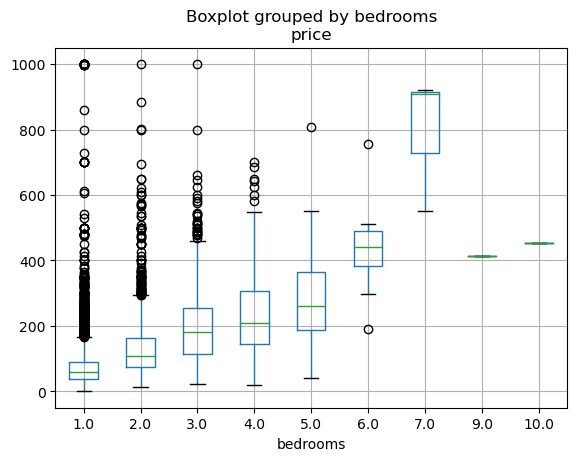

In [20]:
listingsDf[listingsDf['price']<=1000].boxplot(column='price',by='bedrooms')

<Axes: title={'center': 'price'}, xlabel='bathrooms'>

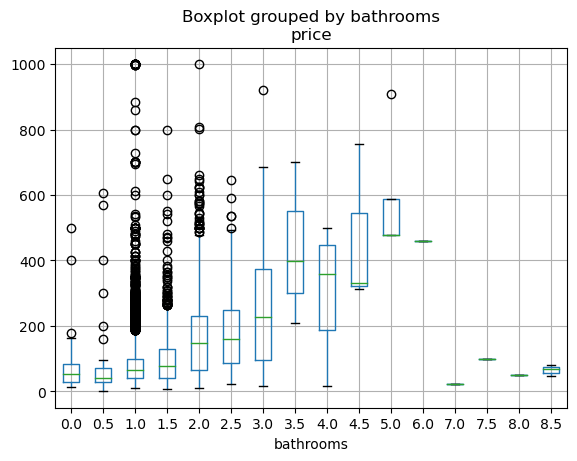

In [21]:
listingsDf[listingsDf['price']<=1000].boxplot(column='price',by='bathrooms')

### Amenities
Next we want to look at the effect certain amenitites have on the price of the airbnb.
Somewhat annoyingly the feature amenities contains the original list as a string, so we need
parse this to convert it back into a list.

In [22]:
listingsDf['amenities'][0]

'["Smoke alarm", "Kitchen", "Private hot tub", "First aid kit", "Cooking basics", "Coffee maker", "Fire extinguisher", "Washer", "Lockbox", "Heating", "Wifi", "Patio or balcony", "Self check-in", "Long term stays allowed", "Hair dryer", "Hangers", "Shampoo", "Iron", "Crib", "Essentials", "Carbon monoxide alarm"]'

In [23]:
def parse_list_string(list_string):
    # Remove the surrounding square brackets from the string
    list_string = list_string.strip('[]')

    # Split the string by commas to get individual elements
    elements = list_string.split(',')

    # Remove any leading or trailing whitespace from the elements
    elements = [element.strip()[1:-1] for element in elements]

    return elements

listingsDf['amenities'] = listingsDf['amenities'].apply(parse_list_string)

In [24]:
listingsDf['amenities'][0]

['Smoke alarm',
 'Kitchen',
 'Private hot tub',
 'First aid kit',
 'Cooking basics',
 'Coffee maker',
 'Fire extinguisher',
 'Washer',
 'Lockbox',
 'Heating',
 'Wifi',
 'Patio or balcony',
 'Self check-in',
 'Long term stays allowed',
 'Hair dryer',
 'Hangers',
 'Shampoo',
 'Iron',
 'Crib',
 'Essentials',
 'Carbon monoxide alarm']

A nice way to visualize text data is a wordcloud. To this effect we concatenate all amenities lists and convert the result to a big string which can then be used to create a wordcloud.

In [25]:
# convert all to lower case
listingsDf['amenities']=listingsDf['amenities'].apply(lambda x: [amenity.replace(' ','_').lower() for amenity in x])

In [26]:
allAmenities = [x.replace(' ','_') for sublist in listingsDf['amenities'] for x in sublist]
amenitiesStr = ' '.join(allAmenities)
amenitiesStr

'smoke_alarm kitchen private_hot_tub first_aid_kit cooking_basics coffee_maker fire_extinguisher washer lockbox heating wifi patio_or_balcony self_check-in long_term_stays_allowed hair_dryer hangers shampoo iron crib essentials carbon_monoxide_alarm smoke_alarm bed_linens oven kitchen microwave cooking_basics coffee_maker stove elevator dishes_and_silverware washer heating room-darkening_shades wifi children\\u2019s_books_and_toys hot_water high_chair paid_parking_off_premises hair_dryer hangers dryer pack_\\u2019n_play/travel_crib babysitter_recommendations children\\u2019s_dinnerware iron tv_with_standard_cable crib dishwasher bathtub essentials refrigerator luggage_dropoff_allowed smoke_alarm bed_linens oven kitchen shower_gel baking_sheet clothing_storage:_closet_and_dresser microwave cooking_basics coffee_maker stove hot_water_kettle elevator dishes_and_silverware washer cleaning_products heating tv wine_glasses wifi hot_water paid_parking_off_premises bidet hair_dryer hangers dry

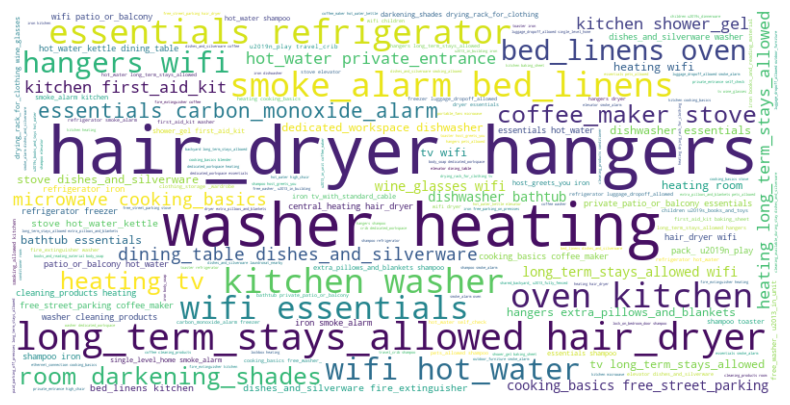

In [27]:
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(amenitiesStr)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

The word cloud suggests that common amenities seemingly include hair dryers, hangers, heating, washers and some other things. We want to extract the 100 most common amenities explicitly.

In [28]:
def get_most_common_words(text, num_words):
    # Preprocessing
    text = re.sub(r'[^\w\s]', '', text.lower())
    words = text.split()
    
    word_counts = Counter(words)
    
    # Sort based on count
    sorted_words = word_counts.most_common(num_words)
    
    # Retrieve the most common words with their counts
    most_common_words = [(word, count) for word, count in sorted_words]
    
    return most_common_words

most_common_words = get_most_common_words(amenitiesStr, 100)
print('amenity, count')
print('--------------')
for word, count in most_common_words:
    print(f'{word}, {count}')

# keep the amenities as a list
most_common_words = [x[0] for x in most_common_words]


amenity, count
--------------
kitchen, 14529
wifi, 14288
essentials, 13790
heating, 12583
long_term_stays_allowed, 12100
hair_dryer, 11210
hangers, 10494
washer, 10310
smoke_alarm, 9449
hot_water, 9434
iron, 8719
dishes_and_silverware, 8423
refrigerator, 7769
cooking_basics, 7749
shampoo, 7290
bed_linens, 6988
oven, 5386
stove, 5257
tv, 5255
coffee_maker, 5016
dishwasher, 4815
dedicated_workspace, 4570
free_street_parking, 4176
first_aid_kit, 3809
elevator, 3684
microwave, 3646
extra_pillows_and_blankets, 3591
fire_extinguisher, 3532
hot_water_kettle, 3460
roomdarkening_shades, 3173
bathtub, 3128
private_entrance, 3123
carbon_monoxide_alarm, 3113
luggage_dropoff_allowed, 3072
host_greets_you, 3062
dining_table, 3031
cleaning_products, 2943
shower_gel, 2794
freezer, 2734
wine_glasses, 2728
pets_allowed, 2698
toaster, 2672
baking_sheet, 2653
self_checkin, 2531
drying_rack_for_clothing, 2469
body_soap, 2407
lock_on_bedroom_door, 2222
smoking_allowed, 2210
dryer, 2062
free_parking_on_premi

To use these as features we will one hot encode the 100 lised above and add them as features.

In [29]:
def amenities_one_hot(amenityString,amenityList):
    if amenityString in amenityList:
        return 1
    else:
        return 0

amenities_to_check = most_common_words

for amenityStr in amenities_to_check:
    listingsDf['amenities_'+amenityStr] = listingsDf['amenities'].apply(lambda x: amenities_one_hot(amenityStr,x))

/tmp/ipykernel_309795/3739985252.py:10: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_309795/3739985252.py:10: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_309795/3739985252.py:10: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_309795/3739985252.py:10: Per

In [30]:
for amenity in amenities_to_check:
    print(listingsDf.groupby('amenities_'+amenity)['price'].mean())

amenities_kitchen
0    106.767205
1    102.957750
Name: price, dtype: float64
amenities_wifi
0    107.979209
1    102.772277
Name: price, dtype: float64
amenities_essentials
0     88.941655
1    105.244526
Name: price, dtype: float64
amenities_heating
0    127.495578
1     97.205869
Name: price, dtype: float64
amenities_long_term_stays_allowed
0     78.199536
1    110.732634
Name: price, dtype: float64
amenities_hair_dryer
0     71.272212
1    116.100690
Name: price, dtype: float64
amenities_hangers
0     76.143952
1    116.734585
Name: price, dtype: float64
amenities_washer
0    125.456527
1     91.597396
Name: price, dtype: float64
amenities_smoke_alarm
0     66.570062
1    127.574499
Name: price, dtype: float64
amenities_hot_water
0     73.728860
1    122.903769
Name: price, dtype: float64
amenities_iron
0     85.818114
1    117.233333
Name: price, dtype: float64
amenities_dishes_and_silverware
0     73.997926
1    128.573159
Name: price, dtype: float64
amenities_refrigerator
0     

### Room and Property Type
Next we want to look at the effect of the property and room type on the price.
First we filter the listings by their property type. We only look at those with more than
50 counts. We can see that most listings are entire rental units or private rooms.

In [31]:
minCounts = 50
listingsDfFilteredByPropertyTypeCounts = listingsDf[listingsDf['property_type'].isin(listingsDf['property_type'].value_counts()[listingsDf['property_type'].value_counts() >=minCounts].index)]

We again use boxplots to visualize the prices per bedroom for the most common property types (we use a cutoff of 500 for the price). This shows the dependence rather well. For example we can see that serviced apartments and rooms in boutique hotels are very expensive while private rooms tend to be less expensive.

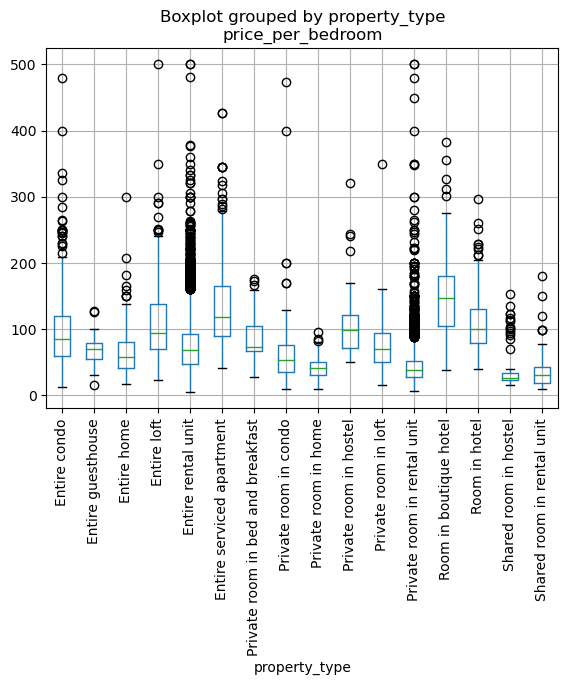

In [32]:
listingsDfFilteredByPropertyTypeCounts[listingsDfFilteredByPropertyTypeCounts['price']<=500].boxplot(column='price_per_bedroom',by='property_type')
plt.xticks(rotation=90)
plt.show()

The room type is even more straightforward as there are only four different categories, with
the majority being entire home or private room. This seems to suggest that the room type gives
partially overlapping information with the property type.

In [33]:
listingsDf['room_type'].value_counts()

Entire home/apt    9496
Private room       5887
Shared room         189
Hotel room          145
Name: room_type, dtype: int64

With this less granular feature we can see even more clearly that in terms of price per bedroom we generally see hotel > entire unit > private room > shared room. The boxplots show this in even more detail.

In [34]:
listingsDf.groupby('room_type')['price_per_bedroom'].median()

room_type
Entire home/apt     70.0
Hotel room         131.0
Private room        40.0
Shared room         27.0
Name: price_per_bedroom, dtype: float64

<Axes: title={'center': 'price_per_bedroom'}, xlabel='room_type'>

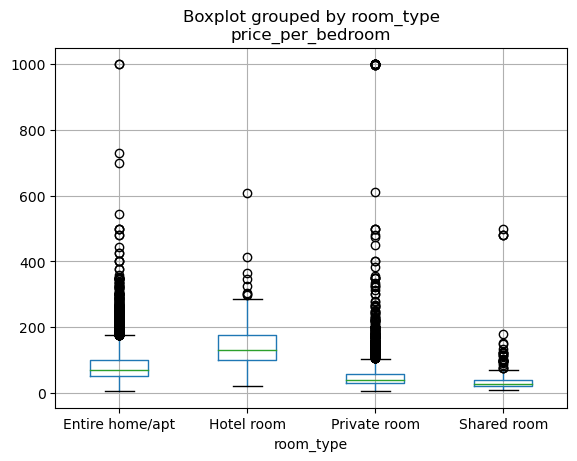

In [35]:
listingsDf[listingsDf['price']<=1000].boxplot(column='price_per_bedroom',by='room_type')

### Instantly Bookable?
The feature instantly bookable seems to correlate somewhat with a higher price. This seems
plausible since this instant bookability will generally involve more effort for the owner, so we might expect them to charge for it. We should not put to much weight on this interpretation though (and similar ones) as this simple observation does not fully determine the underlying causal structure. We hope to capture more subtle interdependencies within the data by fitting our model quite closely to the data.

In [36]:
listingsDf['instant_bookable'].value_counts()

f    11490
t     4227
Name: instant_bookable, dtype: int64

<Axes: title={'center': 'price'}, xlabel='instant_bookable'>

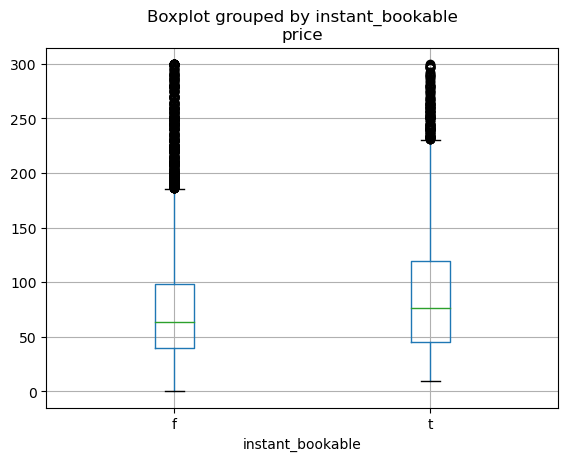

In [37]:
listingsDf[listingsDf['price']<=300].boxplot(column='price',by='instant_bookable')

### User Review
The user reviews are semi structured as they contain mainly written text.
We should obviously start by looking at the structured features, mainly the review scores.
On airbnb review scores can be given for multiple categories. As can be seen from the correlation heat map, they all correlate rather strongly. If we plot a histogram for the overall score we also see that that a large majority of scores are between 4 and 5, with the biggest peak at 5 stars. Both seems to suggest that most people tend to give rather psoitive reviews, which already means we will likely not get a lot of differentiation from these features.


In [38]:
reviewScoresCol = [col for col in listingsDf.columns.to_list() if 'review_scores' in col]
print(reviewScoresCol)

['review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value']


In [39]:
import seaborn as sns

<Axes: >

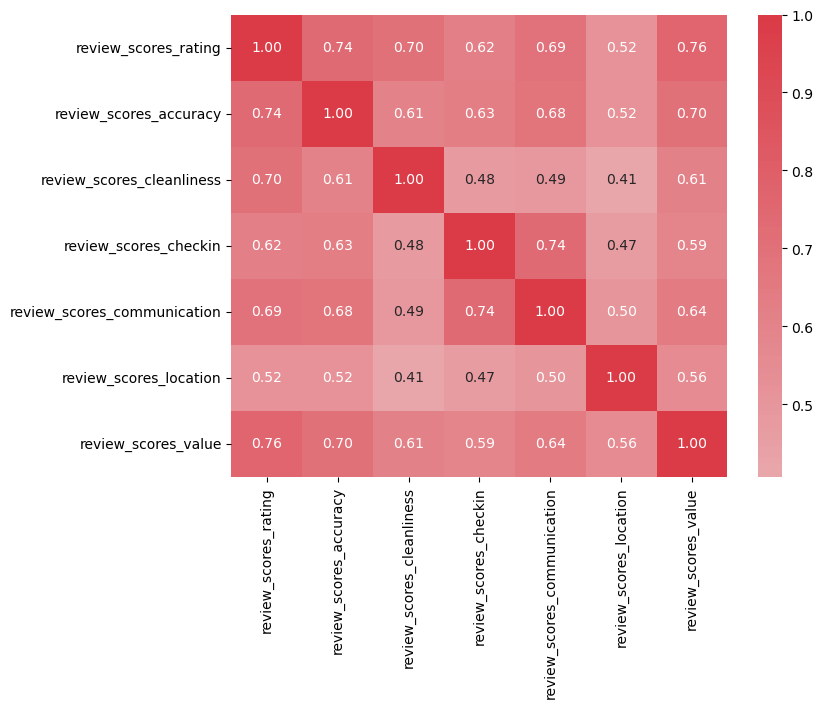

In [40]:
corrMatrixScores = listingsDf[reviewScoresCol].corr()
fig, ax = plt.subplots(figsize=(8, 6))

# Create a colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Generate the heatmap with colorbar
sns.heatmap(corrMatrixScores, cmap=cmap, center=0, annot=True, fmt=".2f", ax=ax)


<Axes: >

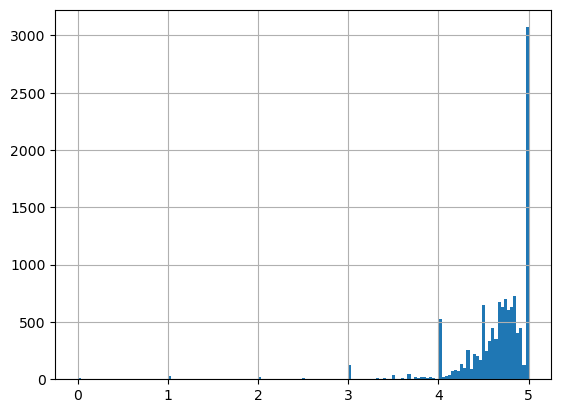

In [41]:
# we use the well known Freedman–Diaconis rule to get a good bin width
def num_bins(series):
    bin_width = 2 * (series.quantile(q=0.75) - series.quantile(q=0.25))/len(series)**(1/3)
    bins = int( (max(series) - min(series)) / bin_width )
    return bins

listingsDf['review_scores_value'].hist(bins=num_bins(listingsDf['review_scores_value']))

To look at the effect on price we round the score down (essentially segmenting 5.0 from 4.x)
and plot boxplots. For lower scores we see that the price tends to also be lower. This seems plausible. Since most scores are so high we would only expect low scores when people have very bad experiences, which is likely less frequent in more expensive listings. But we should again not put too much weight on this explanation since there are not many low scores and the trend is not consistent (median for 1 star is higher than for 2). For 4 and 5 the scores are very close.

In [42]:
listingsDf['review_scores_rating'] = listingsDf['review_scores_rating'].fillna(listingsDf['review_scores_rating'].median())
listingsDf['review_scores_rating_floor'] = np.floor(listingsDf['review_scores_rating'] )

In [43]:
listingsDf['review_scores_rating_floor'].value_counts()

4.0    11123
5.0     4013
3.0      281
0.0      241
1.0       30
2.0       29
Name: review_scores_rating_floor, dtype: int64

<Axes: title={'center': 'price'}, xlabel='review_scores_rating_floor'>

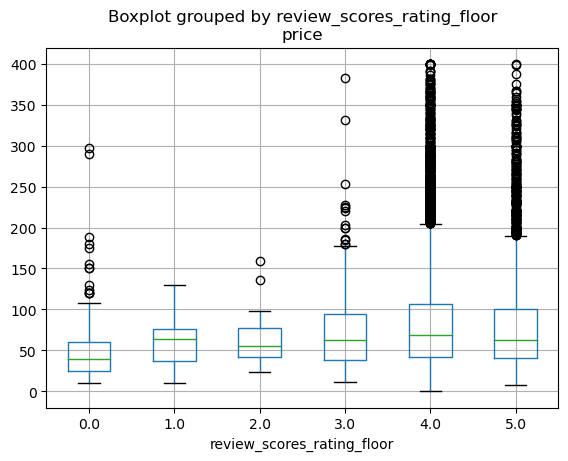

In [44]:
listingsDf[listingsDf['price']<=400].boxplot(column='price',by='review_scores_rating_floor')

It is somewhat tempting to approach this with the full force of some NLP techniques. We could 
for example use sentiment analysis to create some additional features. But since a lot of information is already expressed through the review score 

### Availability
There are multiple features that characterize the availability of the listing.
The feature availability_x gives the number of available days in the next x days.
We first look at the correlations between these.

In [45]:
availabilityCol = [col for col in listingsDf.columns.to_list() if 'availability_' in col]
availabilityCol

['availability_30', 'availability_60', 'availability_90', 'availability_365']

<Axes: >

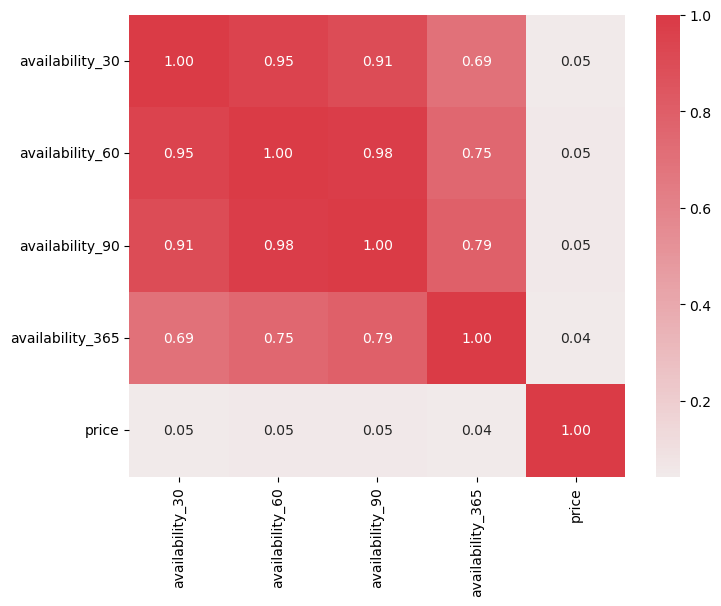

In [46]:
corrMatrixAvailibility = listingsDf[availabilityCol+['price']].corr()
fig, ax = plt.subplots(figsize=(8, 6))

# Create a colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Generate the heatmap with colorbar
sns.heatmap(corrMatrixAvailibility, cmap=cmap, center=0, annot=True, fmt=".2f", ax=ax)

As expected we see a high amount of correlation between the availability features. Interestingly we also see a slight positive correlation between the availabilities
and the price. We investigate this further with boxplots.

<Axes: title={'center': 'price_per_bedroom'}, xlabel='availability_30'>

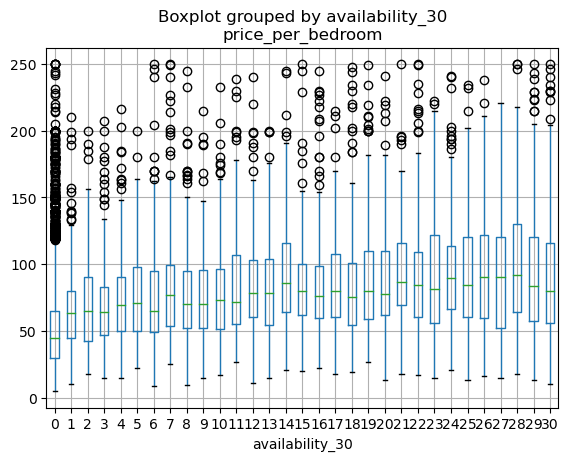

In [47]:
listingsDf[listingsDf['price']<=250].boxplot(column='price_per_bedroom',by='availability_30')


We can see that there is obviously a large amount variance in each availability bin.
A slight drift towards higher prices with more availability can also be observed. To
get a better idea we plot the median price per bedroom in each availability. 

<Axes: xlabel='availability_30', ylabel='median price per bedroom'>

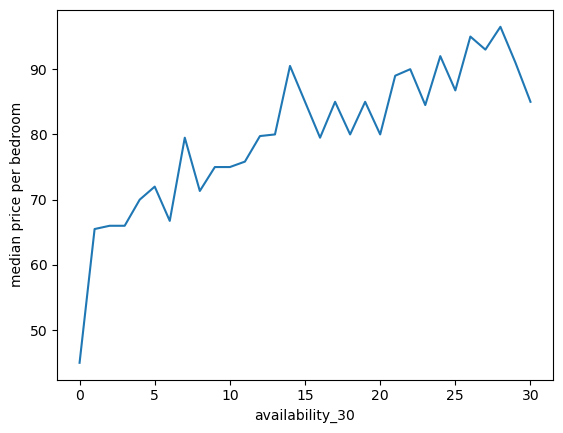

In [48]:
listingsDf.groupby('availability_30')['price_per_bedroom'].median().plot(ylabel='median price per bedroom')

<Axes: xlabel='availability_60', ylabel='median price per bedroom'>

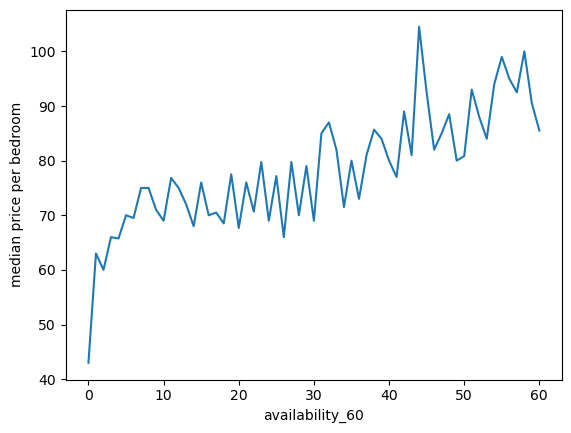

In [49]:
listingsDf.groupby('availability_60')['price_per_bedroom'].median().plot(ylabel='median price per bedroom')

<Axes: xlabel='availability_90', ylabel='median price per bedroom'>

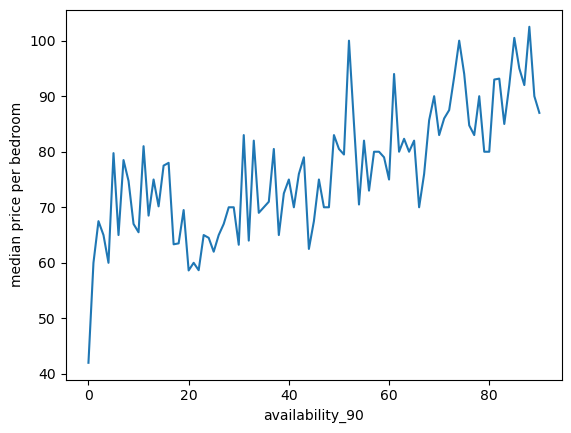

In [50]:
listingsDf.groupby('availability_90')['price_per_bedroom'].median().plot(ylabel='median price per bedroom')

<Axes: xlabel='availability_365', ylabel='median price per bedroom'>

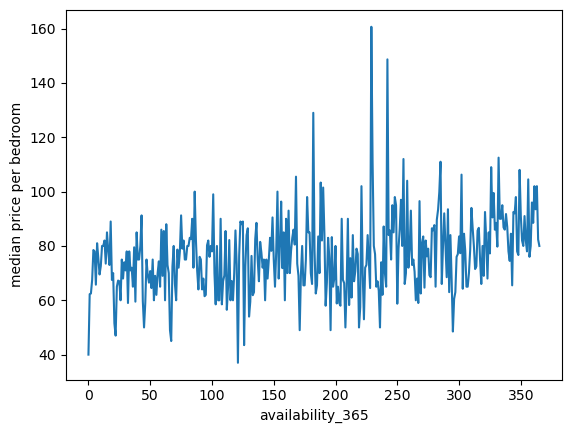

In [51]:
listingsDf.groupby('availability_365')['price_per_bedroom'].median().plot(ylabel='median price per bedroom')

Especially for the first three plots we can clearly see the described effect. It is not exactly clear what the causal explanation for this is. It seems plausible that cheaper listings get booked more and have lower availability because of it but there also be condounding variables or other more complex mechanisms at play.

We can look at the binary feature has_availability with a boxplot. The same effect can be seen. 

<Axes: title={'center': 'price'}, xlabel='has_availability'>

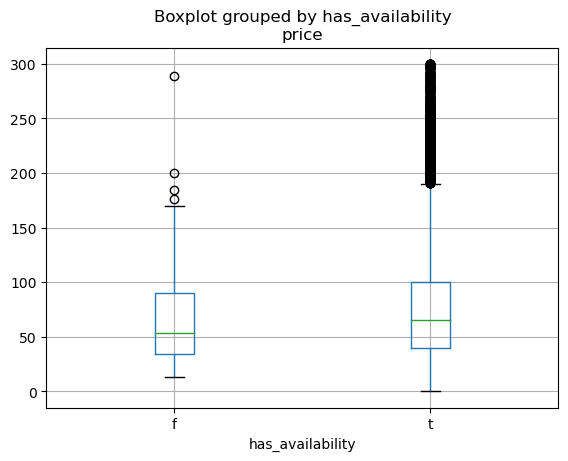

In [52]:
listingsDf[listingsDf['price']<=300].boxplot(column='price',by='has_availability')

### Host Response and Acceptance rate
We can also look at properties of the host. First we look at the hosts response time, which
we have mapped onto integers ordinally.

In [53]:
listingsDf['host_response_time'].value_counts()

0.0    4673
1.0    1588
2.0    1399
3.0     321
Name: host_response_time, dtype: int64

<Axes: title={'center': 'price'}, xlabel='host_response_time'>

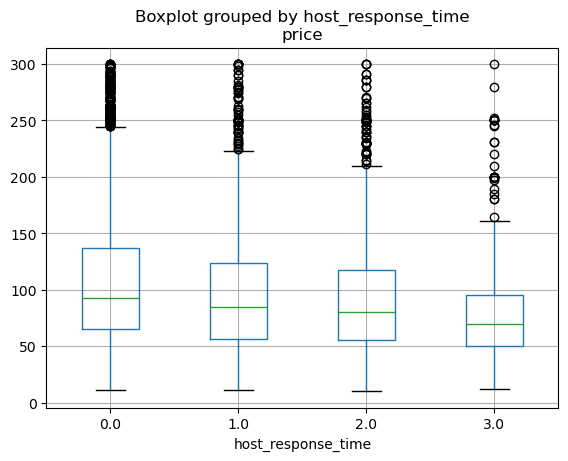

In [54]:
listingsDf[listingsDf['price']<=300].boxplot(column='price',by='host_response_time')


<Axes: xlabel='host_response_time', ylabel='median price'>

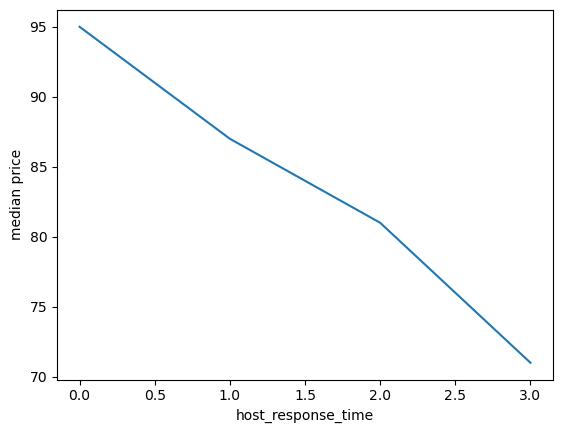

In [55]:
listingsDf.groupby('host_response_time')['price'].median().plot(ylabel='median price')

From both plots we observe a clear decrease in price when the host takes longer to respond.
Again the reasoning behind this is not straightforward. As a fast response time
can be seen as a service it makes sense that this would cost, but the precise mechanism
is likely more complex.

For host_response_rate and host_acceptance_rate the same plot do not seem to suggest any
obvious trend.

<Axes: xlabel='host_response_rate', ylabel='median price'>

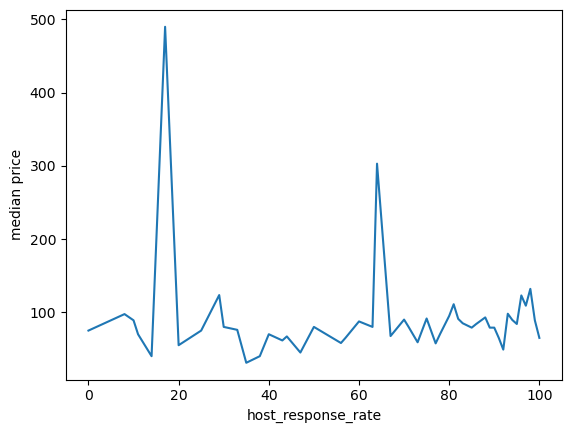

In [56]:
listingsDf.groupby('host_response_rate')['price'].median().plot(ylabel='median price')

<Axes: xlabel='host_acceptance_rate', ylabel='median price'>

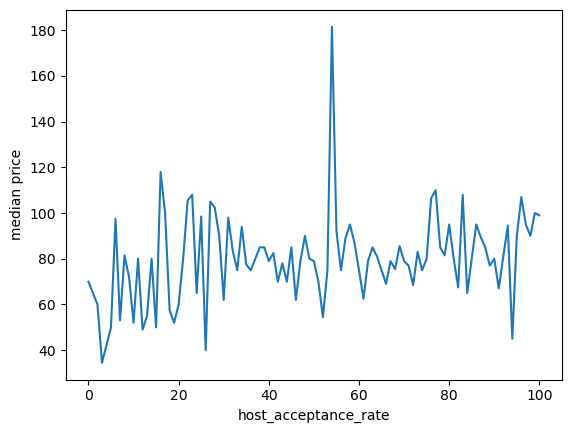

In [57]:
listingsDf.groupby('host_acceptance_rate')['price'].median().plot(ylabel='median price')

### Host is superhost or verified
We would expect that hosts who are verified or superhost charge more since this
indicates more professionality/ a more serious approach. From two boxplots
we can see that this seems to be the case.

<Axes: title={'center': 'price'}, xlabel='host_is_superhost'>

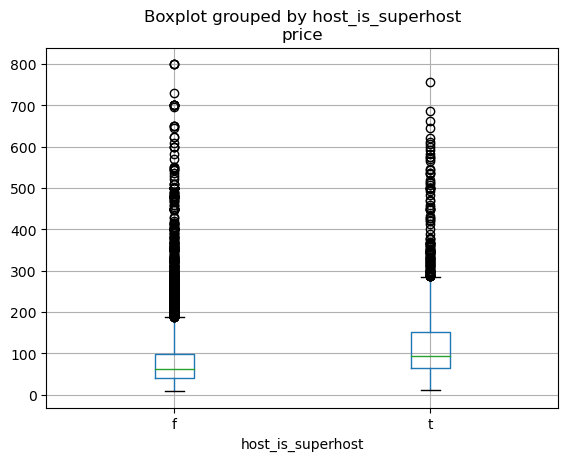

In [58]:
listingsDf[listingsDf['price']<=800].boxplot(column='price',by='host_is_superhost')

<Axes: title={'center': 'price'}, xlabel='host_identity_verified'>

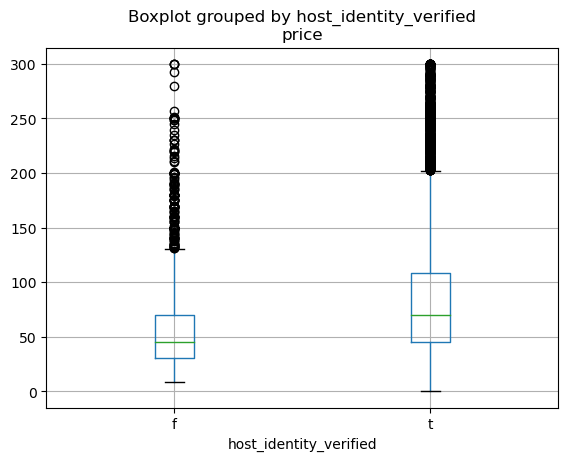

In [59]:
listingsDf[listingsDf['price']<=300].boxplot(column='price',by='host_identity_verified')

# Regression Model
After having done some EDA we want to fit our pricing model.
Ensemble boosting models are state of the art for this kind of tabular data,
so we will use XGboost. There also other viable options like catboost, but we will
stick with XGB for this project. Our goal is not to get the absolute best performance
possible.

We start by loading all of the four datasets we got and concatenating them into one dataframe.
After that we apply some necessary preprocessing.

In [60]:
listingsPath1 = 'data_all/listings1.csv'
listingsPath2 = 'data_all/listings2.csv'
listingsPath3 = 'data_all/listings3.csv'
listingsPath4 = 'data_all/listings4.csv'

listingsDf1 = pd.read_csv(listingsPath1)
listingsDf2 = pd.read_csv(listingsPath2)
listingsDf3 = pd.read_csv(listingsPath3)
listingsDf4 = pd.read_csv(listingsPath4)

listingsDf = pd.concat([listingsDf1, listingsDf2,listingsDf3,listingsDf4], ignore_index=True)

listingsDf['listing_id'] = listingsDf['id']

In [61]:
listingsDf['price'] = listingsDf['price'].apply(lambda x:float(x[1:].replace(',','')))

In [62]:
listingsDf.replace({'host_response_time':{'within an hour' : 0, 'within a few hours' : 1,'within a day' : 2, 'a few days or more' : 3}},inplace=True)
listingsDf.replace({'host_is_superhost':{'f' : 0, 't' : 1}},inplace=True)
listingsDf.replace({'host_identity_verified':{'f' : 0, 't' : 1}},inplace=True)

In [63]:
listingsDf['host_identity_verified'].value_counts()

1.0    51233
0.0     9573
Name: host_identity_verified, dtype: int64

In [64]:
listingsDf['amenities']=listingsDf['amenities'].apply(parse_list_string)

In [65]:
listingsDf['amenities']= listingsDf['amenities'].apply(lambda x: [amenity.replace(' ','_').lower() for amenity in x])


In [66]:
listingsDf['amenities']=listingsDf['amenities'].apply(lambda x: [amenity.replace(' ','_').lower() for amenity in x])

def amenities_one_hot(amenityString,amenityList):
    if amenityString in amenityList:
        return 1
    else:
        return 0

amenities_to_check = most_common_words

for amenityStr in amenities_to_check:
    listingsDf['amenities_'+amenityStr] = listingsDf['amenities'].apply(lambda x: amenities_one_hot(amenityStr,x))

/tmp/ipykernel_309795/1016473366.py:12: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_309795/1016473366.py:12: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_309795/1016473366.py:12: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_309795/1016473366.py:12: Per

After importing a bunch of sklearn functions we split our training data into a train, validation and test set (60/20/20). Next we define the features we want to use in our model.
We want to keep features have shown an effect on the price while also being
relatively easily accesible as we want users to be able to read off all necessry features from a listing without much trouble. For example we do not consider the review scores as this would be somewhat tedious to put in and we did not really see a strong predictive effect anyway.

We want to do all the other preprocessing in a pipeline. We create some custom sklearn classes for that.

In [67]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from itertools import product
from sklearn.model_selection import KFold, cross_val_score


# Split the dataframe into train, validation, and test sets
train_df, temp_df = train_test_split(listingsDf, test_size=0.4, random_state=1023)
validation_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=1023)


In [68]:
columns_to_keep = [col for col in listingsDf.columns.to_list() if 'availability_' in col]
columns_to_keep += [col for col in listingsDf.columns.to_list() if 'amenities_' in col]
columns_to_keep += ['neighbourhood_group_cleansed']
columns_to_keep += ['neighbourhood_cleansed','property_type','room_type','host_is_superhost']
columns_to_keep += ['bathrooms_text','bedrooms','beds','price']
columns_to_keep +=['host_identity_verified','host_response_time']

# transformer to turn bathroom/bedroom text into number of bathrooms/bedrooms
class BathroomsBedroomsTransformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    
    def bathroom_cleanup(self, bath):
        try:
            return float(bath.split()[0])
        except:
            return 0.5
    
    def transform(self, X):
        X = X.copy()
        X['bathrooms'] = X['bathrooms_text'].apply(self.bathroom_cleanup)
        X = X.drop(['bathrooms_text'], axis=1)
        X['bathrooms'] = X['bathrooms'].fillna(X['bathrooms'].median())
        X['bedrooms'] = X['bedrooms'].fillna(X['bedrooms'].median())
        return X

# transformer to keep specified columns
class DataFrameTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        return X[self.columns]

class CustomOneHotEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, columns_to_encode, threshold=70):
        self.columns_to_encode = columns_to_encode
        self.threshold = threshold
        self.encoders = {}
    
    def fit(self, X, y=None):
        for column in self.columns_to_encode:
            categories = X[column].value_counts()[X[column].value_counts()>=self.threshold].keys()
            self.encoders[column] = categories
        return self
    
    def transform(self, X):
        X = X.copy()
        for column, categories in self.encoders.items():
            for category in categories:
                X[f'{column}_{category}'] = (X[column] == category).astype(int)
            X.drop(column, axis=1, inplace=True)
        return X

#impute categoricals on most frequent and numericals on median
class ImputerTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, strategy):
        self.strategy = strategy
        self.imputers = {}
    
    def fit(self, X, y=None):
        for column in X.columns:
            if X[column].dtype == 'O':
                imputer = SimpleImputer(strategy='most_frequent')
            else:
                imputer = SimpleImputer(strategy=self.strategy)
            imputer.fit(X[[column]])
            self.imputers[column] = imputer
        return self
    
    def transform(self, X):
        X = X.copy()
        for column, imputer in self.imputers.items():
            X[column] = imputer.transform(X[[column]])
        return X



# Preprocessing transformers
drop_columns_transformer = DataFrameTransformer(columns=columns_to_keep)

impute_transformer = ImputerTransformer(strategy='median')

custom_one_hot_encoder = CustomOneHotEncoder(columns_to_encode=['neighbourhood_cleansed','neighbourhood_group_cleansed','property_type','room_type'], threshold=70)


# Define the pipeline
pipeline = Pipeline([
    ('drop_columns', drop_columns_transformer),
    ('bathrooms_bedrooms_transform', BathroomsBedroomsTransformer()),
    ('impute', impute_transformer),
    ('one_hot_encode', custom_one_hot_encoder)
])


In [69]:
# fit the pipeline on the training data
pipeline.fit(train_df)

# apply the pipeline on the test and valid data
processed_train_df = pipeline.transform(train_df)
processed_validation_df = pipeline.transform(validation_df)
processed_test_df = pipeline.transform(test_df)

/tmp/ipykernel_309795/2205682194.py:54: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_309795/2205682194.py:54: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_309795/2205682194.py:54: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_309795/2205682194.py:54: Per

/tmp/ipykernel_309795/2205682194.py:54: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_309795/2205682194.py:54: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_309795/2205682194.py:54: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_309795/2205682194.py:54: Per

After fitting our pipeline onto the training data we end up with over 200 columns.
For example we get binary features for every neighbourhood and property type.

In [70]:
for i in processed_train_df.columns:
    print(i)

availability_30
availability_60
availability_90
availability_365
amenities_kitchen
amenities_wifi
amenities_essentials
amenities_heating
amenities_long_term_stays_allowed
amenities_hair_dryer
amenities_hangers
amenities_washer
amenities_smoke_alarm
amenities_hot_water
amenities_iron
amenities_dishes_and_silverware
amenities_refrigerator
amenities_cooking_basics
amenities_shampoo
amenities_bed_linens
amenities_oven
amenities_stove
amenities_tv
amenities_coffee_maker
amenities_dishwasher
amenities_dedicated_workspace
amenities_free_street_parking
amenities_first_aid_kit
amenities_elevator
amenities_microwave
amenities_extra_pillows_and_blankets
amenities_fire_extinguisher
amenities_hot_water_kettle
amenities_roomdarkening_shades
amenities_bathtub
amenities_private_entrance
amenities_carbon_monoxide_alarm
amenities_luggage_dropoff_allowed
amenities_host_greets_you
amenities_dining_table
amenities_cleaning_products
amenities_shower_gel
amenities_freezer
amenities_wine_glasses
amenities_pet

In [71]:
# split data into descriptive and target feature
X_train = processed_train_df.drop('price', axis=1)
y_train = processed_train_df['price']

X_validation = processed_validation_df.drop('price', axis=1)
y_validation = processed_validation_df['price']

X_test = processed_test_df.drop('price', axis=1)
y_test = processed_test_df['price']

For optimal performance one should use some hyperparameter tuning method like grid search.
Experience shows that adjusting the parameters by hand can get you very get results for xgboost so we will just stick with that.

In [72]:
# setting up our xgb
xgb = XGBRegressor(
    n_estimators=1000,
    learning_rate=0.1,
    max_depth=15,
    random_state=42,       
    min_child_weight= 1,
    sub_sample=0.9,
    gamma= 0,
)


In [73]:
eval_set = [(X_train, y_train),(X_validation, y_validation)]

# Fit the XGBRegressor on the training data with progress printing
xgb.fit(X_train, y_train, eval_set=eval_set, eval_metric='mae')

/home/aaron/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:885: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

/home/aaron/anaconda3/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning:

[17:27:36] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "sub_sample" } are not used.




[0]	validation_0-mae:53.54484	validation_1-mae:59.49012
[1]	validation_0-mae:49.96327	validation_1-mae:56.36941
[2]	validation_0-mae:46.78755	validation_1-mae:53.66818
[3]	validation_0-mae:43.89829	validation_1-mae:51.30005
[4]	validation_0-mae:41.24352	validation_1-mae:49.10321
[5]	validation_0-mae:38.88791	validation_1-mae:47.23549
[6]	validation_0-mae:36.80527	validation_1-mae:45.62097
[7]	validation_0-mae:34.91456	validation_1-mae:44.21320
[8]	validation_0-mae:33.16547	validation_1-mae:42.91139
[9]	validation_0-mae:31.59057	validation_1-mae:41.82024
[10]	validation_0-mae:30.19196	validation_1-mae:40.94928
[11]	validation_0-mae:28.83627	validation_1-mae:40.08713
[12]	validation_0-mae:27.67206	validation_1-mae:39.33573
[13]	validation_0-mae:26.58836	validation_1-mae:38.65166
[14]	validation_0-mae:25.54540	validation_1-mae:38.05163
[15]	validation_0-mae:24.65474	validation_1-mae:37.52042
[16]	validation_0-mae:23.85464	validation_1-mae:37.07394
[17]	validation_0-mae:23.14642	validation

[144]	validation_0-mae:7.14083	validation_1-mae:30.08142
[145]	validation_0-mae:7.10805	validation_1-mae:30.06914
[146]	validation_0-mae:7.06414	validation_1-mae:30.05092
[147]	validation_0-mae:7.03752	validation_1-mae:30.03891
[148]	validation_0-mae:7.00370	validation_1-mae:30.02038
[149]	validation_0-mae:6.94043	validation_1-mae:30.00056
[150]	validation_0-mae:6.90833	validation_1-mae:29.99618
[151]	validation_0-mae:6.88396	validation_1-mae:29.99298
[152]	validation_0-mae:6.85876	validation_1-mae:29.98867
[153]	validation_0-mae:6.82974	validation_1-mae:29.97431
[154]	validation_0-mae:6.79185	validation_1-mae:29.96320
[155]	validation_0-mae:6.76128	validation_1-mae:29.95204
[156]	validation_0-mae:6.73251	validation_1-mae:29.94030
[157]	validation_0-mae:6.70784	validation_1-mae:29.92958
[158]	validation_0-mae:6.65449	validation_1-mae:29.90641
[159]	validation_0-mae:6.61776	validation_1-mae:29.89121
[160]	validation_0-mae:6.59330	validation_1-mae:29.87963
[161]	validation_0-mae:6.57433	

[288]	validation_0-mae:3.13925	validation_1-mae:28.30506
[289]	validation_0-mae:3.11125	validation_1-mae:28.29105
[290]	validation_0-mae:3.08348	validation_1-mae:28.27589
[291]	validation_0-mae:3.06145	validation_1-mae:28.26366
[292]	validation_0-mae:3.03241	validation_1-mae:28.24976
[293]	validation_0-mae:3.00797	validation_1-mae:28.23739
[294]	validation_0-mae:2.99698	validation_1-mae:28.23262
[295]	validation_0-mae:2.98417	validation_1-mae:28.22596
[296]	validation_0-mae:2.96892	validation_1-mae:28.21751
[297]	validation_0-mae:2.95142	validation_1-mae:28.20882
[298]	validation_0-mae:2.92880	validation_1-mae:28.19361
[299]	validation_0-mae:2.91783	validation_1-mae:28.18889
[300]	validation_0-mae:2.91041	validation_1-mae:28.18801
[301]	validation_0-mae:2.90164	validation_1-mae:28.18411
[302]	validation_0-mae:2.88880	validation_1-mae:28.17701
[303]	validation_0-mae:2.88408	validation_1-mae:28.17514
[304]	validation_0-mae:2.87019	validation_1-mae:28.16748
[305]	validation_0-mae:2.85932	

[432]	validation_0-mae:1.59639	validation_1-mae:27.55931
[433]	validation_0-mae:1.58932	validation_1-mae:27.55570
[434]	validation_0-mae:1.58658	validation_1-mae:27.55551
[435]	validation_0-mae:1.57798	validation_1-mae:27.55144
[436]	validation_0-mae:1.57075	validation_1-mae:27.54735
[437]	validation_0-mae:1.56564	validation_1-mae:27.54551
[438]	validation_0-mae:1.55912	validation_1-mae:27.54225
[439]	validation_0-mae:1.55214	validation_1-mae:27.53756
[440]	validation_0-mae:1.54015	validation_1-mae:27.52819
[441]	validation_0-mae:1.53552	validation_1-mae:27.52649
[442]	validation_0-mae:1.53093	validation_1-mae:27.52461
[443]	validation_0-mae:1.52728	validation_1-mae:27.52252
[444]	validation_0-mae:1.52346	validation_1-mae:27.52196
[445]	validation_0-mae:1.51918	validation_1-mae:27.52188
[446]	validation_0-mae:1.51320	validation_1-mae:27.51913
[447]	validation_0-mae:1.51016	validation_1-mae:27.51799
[448]	validation_0-mae:1.50664	validation_1-mae:27.51754
[449]	validation_0-mae:1.50281	

[576]	validation_0-mae:0.86058	validation_1-mae:27.17052
[577]	validation_0-mae:0.85379	validation_1-mae:27.16711
[578]	validation_0-mae:0.84719	validation_1-mae:27.16350
[579]	validation_0-mae:0.84474	validation_1-mae:27.16234
[580]	validation_0-mae:0.84248	validation_1-mae:27.16096
[581]	validation_0-mae:0.83458	validation_1-mae:27.15642
[582]	validation_0-mae:0.83201	validation_1-mae:27.15489
[583]	validation_0-mae:0.82991	validation_1-mae:27.15372
[584]	validation_0-mae:0.82815	validation_1-mae:27.15271
[585]	validation_0-mae:0.82598	validation_1-mae:27.15125
[586]	validation_0-mae:0.82467	validation_1-mae:27.15051
[587]	validation_0-mae:0.82348	validation_1-mae:27.15000
[588]	validation_0-mae:0.82159	validation_1-mae:27.14904
[589]	validation_0-mae:0.82011	validation_1-mae:27.14858
[590]	validation_0-mae:0.81859	validation_1-mae:27.14764
[591]	validation_0-mae:0.81546	validation_1-mae:27.14565
[592]	validation_0-mae:0.81254	validation_1-mae:27.14285
[593]	validation_0-mae:0.80986	

[720]	validation_0-mae:0.58169	validation_1-mae:27.00604
[721]	validation_0-mae:0.58085	validation_1-mae:27.00572
[722]	validation_0-mae:0.58035	validation_1-mae:27.00577
[723]	validation_0-mae:0.57975	validation_1-mae:27.00540
[724]	validation_0-mae:0.57840	validation_1-mae:27.00412
[725]	validation_0-mae:0.57577	validation_1-mae:27.00284
[726]	validation_0-mae:0.57492	validation_1-mae:27.00225
[727]	validation_0-mae:0.57364	validation_1-mae:27.00131
[728]	validation_0-mae:0.57282	validation_1-mae:27.00079
[729]	validation_0-mae:0.57194	validation_1-mae:27.00048
[730]	validation_0-mae:0.57078	validation_1-mae:26.99952
[731]	validation_0-mae:0.56785	validation_1-mae:26.99754
[732]	validation_0-mae:0.56639	validation_1-mae:26.99670
[733]	validation_0-mae:0.56536	validation_1-mae:26.99599
[734]	validation_0-mae:0.56424	validation_1-mae:26.99522
[735]	validation_0-mae:0.56359	validation_1-mae:26.99481
[736]	validation_0-mae:0.56284	validation_1-mae:26.99448
[737]	validation_0-mae:0.56254	

[864]	validation_0-mae:0.43445	validation_1-mae:26.92197
[865]	validation_0-mae:0.43391	validation_1-mae:26.92162
[866]	validation_0-mae:0.43332	validation_1-mae:26.92130
[867]	validation_0-mae:0.43262	validation_1-mae:26.92091
[868]	validation_0-mae:0.43240	validation_1-mae:26.92078
[869]	validation_0-mae:0.43222	validation_1-mae:26.92065
[870]	validation_0-mae:0.43172	validation_1-mae:26.92050
[871]	validation_0-mae:0.43127	validation_1-mae:26.92026
[872]	validation_0-mae:0.43092	validation_1-mae:26.92004
[873]	validation_0-mae:0.43064	validation_1-mae:26.91986
[874]	validation_0-mae:0.43016	validation_1-mae:26.91958
[875]	validation_0-mae:0.42986	validation_1-mae:26.91938
[876]	validation_0-mae:0.42921	validation_1-mae:26.91923
[877]	validation_0-mae:0.42888	validation_1-mae:26.91909
[878]	validation_0-mae:0.42859	validation_1-mae:26.91887
[879]	validation_0-mae:0.42833	validation_1-mae:26.91875
[880]	validation_0-mae:0.42809	validation_1-mae:26.91865
[881]	validation_0-mae:0.42752	

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=15, max_leaves=None,
             min_child_weight=1, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [74]:
y_pred = xgb.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
print("mean absolute Error:", mae)

mean absolute Error: 36.86003738764697


In [75]:
print('real vs predicted price:')
for i in range(15):
    print(f'{list(y_test)[i]}, {y_pred[i]:.2f}')

real vs predicted price:
135.0, 158.56
25.0, 25.14
51.0, 55.37
308.0, 328.53
79.0, 150.18
80.0, 85.34
84.0, 96.85
192.0, 186.80
40.0, 41.75
40.0, 44.23
45.0, 45.12
75.0, 75.31
22.0, 36.09
65.0, 62.91
180.0, 132.60


Our XGB is very big with 1000 estimators. We ended up achieving an MAE of 0.37 and an MAE of 26.9 on the validation set, 36.9 on the test set. Our model is obviously very overfit but as we can see in the fitting output the validation loss kept decreasing even when the training loss was already extremely low so we have not missed a minimum in the validation loss.
From the test set we can also see that it generalizes quite well.
I have printed the results for the first 15 listings and the prices generally fit very well with some outliers.
This is not really too surprising as the price is not uniqely determined by all the features given, so we wouldnt expect it to get the real price all the time (some people over or undercharge).

For the final model we train the same xgb on the full data set and save it using pickle.

In [76]:
full_train_df = listingsDf
pipeline.fit(full_train_df)

fullDf = pipeline.transform(full_train_df)

X_full = fullDf.drop('price',axis=1)
y_full = fullDf['price']

xgb.fit(X_full,y_full)

/tmp/ipykernel_309795/2205682194.py:54: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_309795/2205682194.py:54: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_309795/2205682194.py:54: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_309795/2205682194.py:54: Per

/tmp/ipykernel_309795/2205682194.py:54: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_309795/2205682194.py:54: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_309795/2205682194.py:54: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_309795/2205682194.py:54: Per

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=15, max_leaves=None,
             min_child_weight=1, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [77]:
y_pred_full = xgb.predict(X_full)

mae = mean_absolute_error(y_full, y_pred_full)
print("mean absolute Error:", mae)

mean absolute Error: 0.6658664124347212


In [78]:
import pickle

filename_model = 'xgb_airbnb.pkl'
pickle.dump(xgb, open(filename_model, 'wb'))